In [1]:
import import_ipynb
import Scanpy_functions_v03262021 as sc_pipe
import scvelo as scv
scv.logging.print_version()
import warnings
import scirpy as ir
import scanpy as sc
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
import bbknn
import logging
from sklearn.mixture import GaussianMixture
from scipy.stats     import norm
import glob
import os
import hvplot.pandas
import docx
from docx import Document
from docx.shared import Inches
from docx.shared import Pt
from scipy import sparse
import scanpy.external as sce
import holoviews as hv
import panel as pn
import bokeh
from bokeh.resources import INLINE
import scanorama
import gseapy

importing Jupyter notebook from Scanpy_functions_v03262021.ipynb
Running scvelo 0.2.4 (python 3.9.7) on 2022-10-13 09:39.


ERROR: XMLRPC request failed [code: -32500]
RuntimeError: PyPI's XMLRPC API is currently disabled due to unmanageable load and will be deprecated in the near future. See https://status.python.org/ for more information.


Running scvelo 0.2.4 (python 3.9.7) on 2022-10-13 09:40.


ERROR: XMLRPC request failed [code: -32500]
RuntimeError: PyPI's XMLRPC API is currently disabled due to unmanageable load and will be deprecated in the near future. See https://status.python.org/ for more information.


In [2]:


In_path = '/user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/'

out_path = '/user/ifrec/liuyuchen/Analysis_Reports/Akira_Fukusima_scRNASeq/human/'

In [3]:
#sc.set_figure_params(scanpy=True, dpi=200,  figsize=[12.8,9.6])
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.set_figure_params('scvelo')  # for beautified visualization


In [4]:
adata = sc.read_h5ad(out_path+'/human_subset_0707_cluster3_6.h5ad')


In [5]:
adata

AnnData object with n_obs × n_vars = 49925 × 7567
    obs: 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'Sample', 'batch', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb', 'doublet_score', 'predicted_doublet', 'n_counts', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'log_counts', 'leiden', 'Cell_Type', 'leiden_resol_3', 'Defined_type', 'Monocyte_factors', 'CD14_binary', 'FCGR3A_binary', 'CCR2_binary', 'CX3CR1_binary', 'Tcell_factors', 'CD8A_binary', 'CD3E_binary', 'velocity_self_transition'
    var: 'gene_ids', 'feature_types', 'genome', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', '

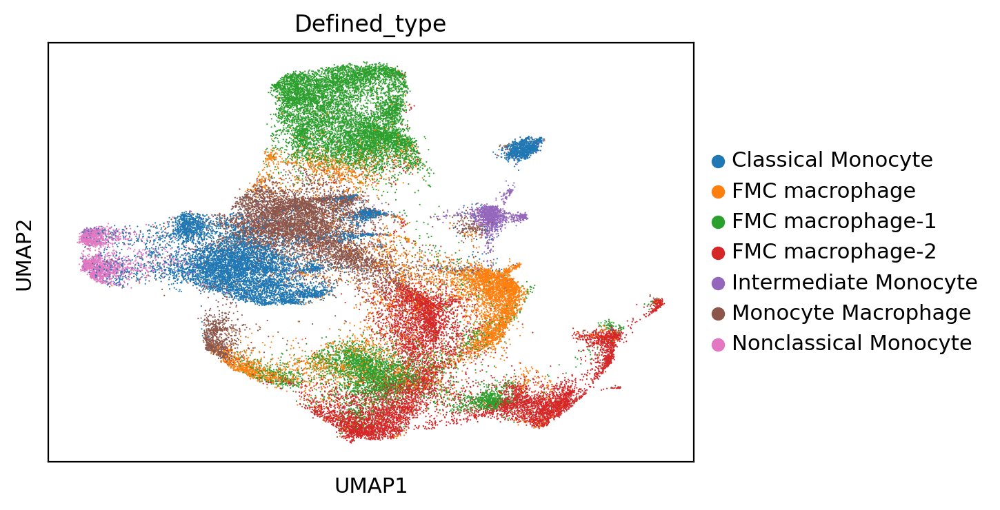

In [6]:
sc.pl.umap(adata, color = 'Defined_type')

In [7]:
import itertools

In [11]:
def Plot_cluster_pair(combo,cpdb_mean):
    a =combo[0]+'|'+combo[1]
    b =combo[1]+'|'+combo[0]
    x = cpdb_mean[pd.notna(cpdb_mean[a])][['interacting_pair',a]]
    new = x['interacting_pair'].str.split("_", n=1 ,expand = True)
    x[combo[0]] = new[0]
    x[combo[1]] = new[1]
    y=x.pivot_table(columns=combo[0], index=combo[1], values=a)
    x = cpdb_mean[pd.notna(cpdb_mean[b])][['interacting_pair',b]]
    new = x['interacting_pair'].str.split("_", n=1 ,expand = True)
    x[combo[1]] = new[0]
    x[combo[0]] = new[1]
    z=x.pivot_table(columns=combo[1], index=combo[0], values=b)
    fig, axs = plt.subplots(1,2,figsize=(25,10))
    fig.suptitle('Cell Cell Communication between '+combo[0]+' and '+combo[1])
    axs[0].set_title(combo[0]+' to '+combo[1])
    sb.heatmap(y,ax=axs[0],linewidths=0.5,xticklabels=1, yticklabels=1)
    y.to_csv(combo[0]+' to '+combo[1]+'.csv')
    axs[1].set_title(combo[1]+' to '+combo[0])
    sb.heatmap(z,ax=axs[1],linewidths=0.5,xticklabels=1, yticklabels=1)
    z.to_csv(combo[1]+' to '+combo[0]+'.csv')

In [12]:
cellphone_folder='/user/ifrec/liuyuchen/Analysis_Reports/Akira_Fukusima_scRNASeq/cellphonedb/human_sub_2/'

In [13]:
cpdb_mean = pd.read_csv(cellphone_folder+'/out/significant_means.txt',sep='\t')

## Interaction of Defined Groups 

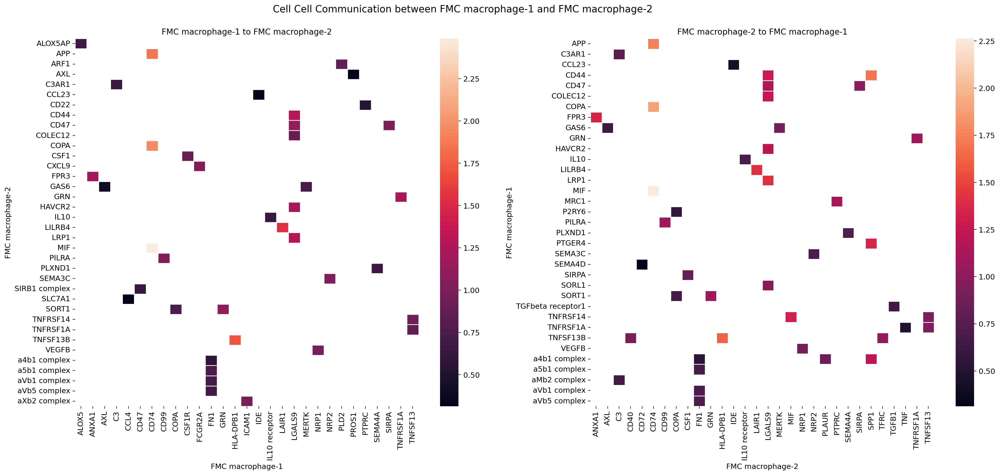

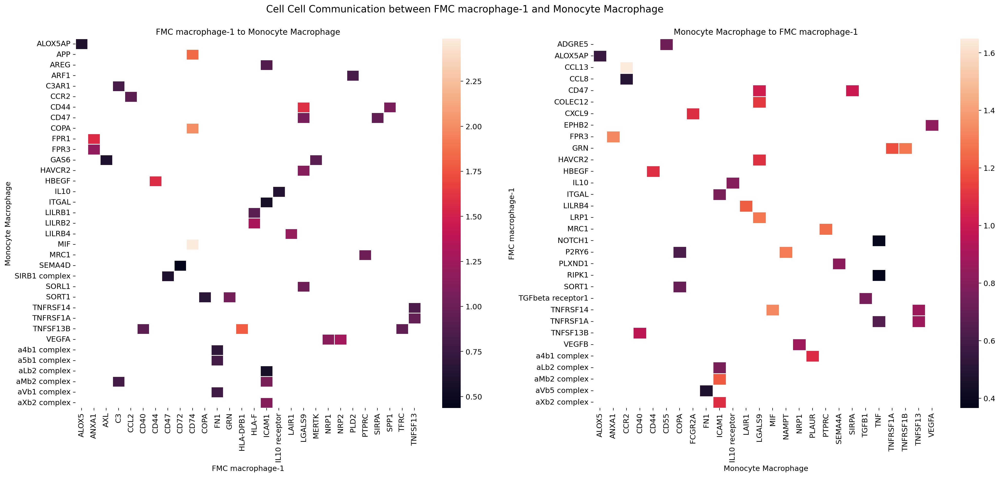

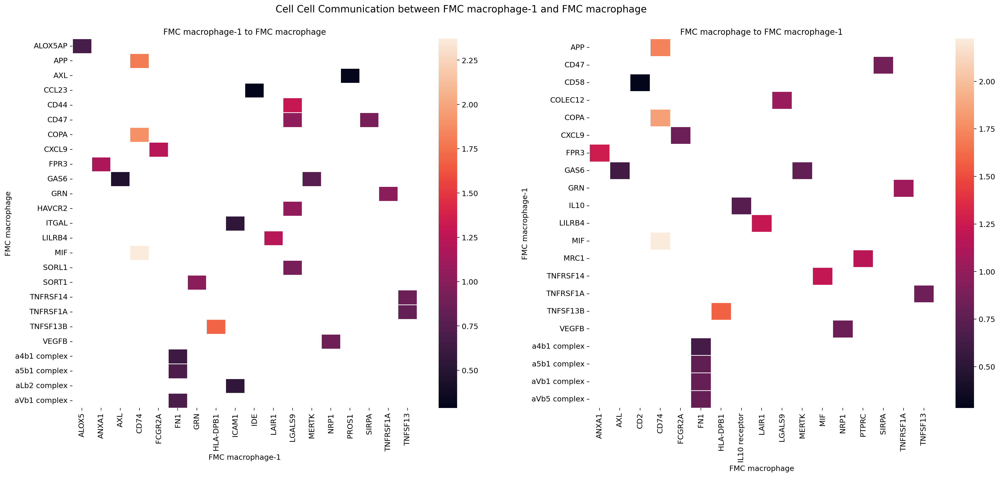

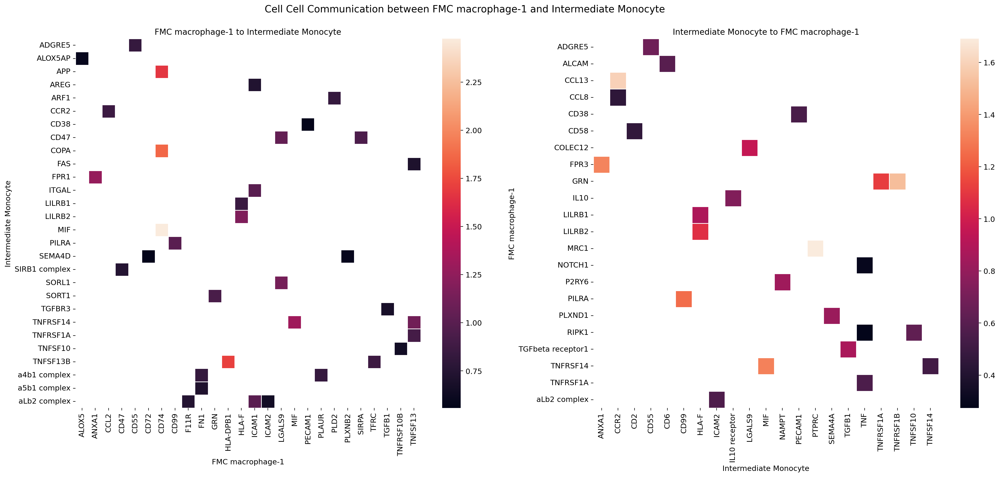

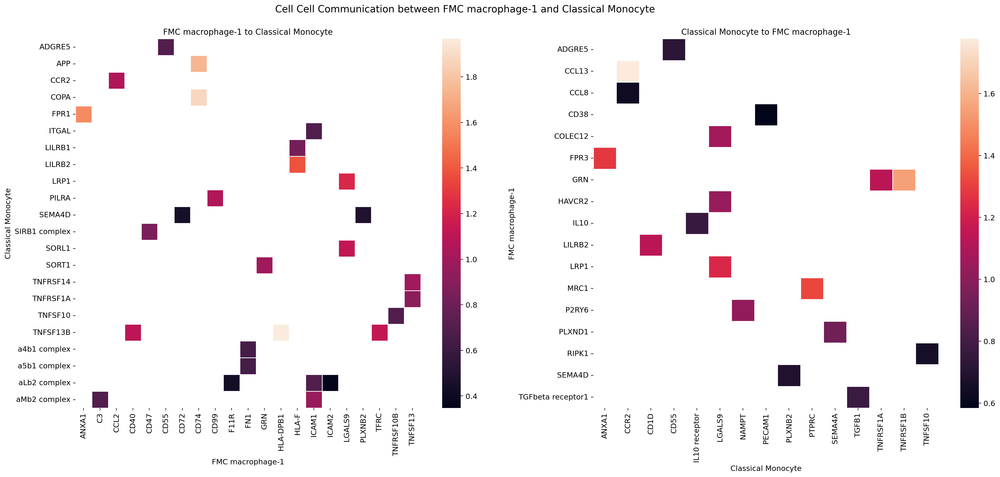

...

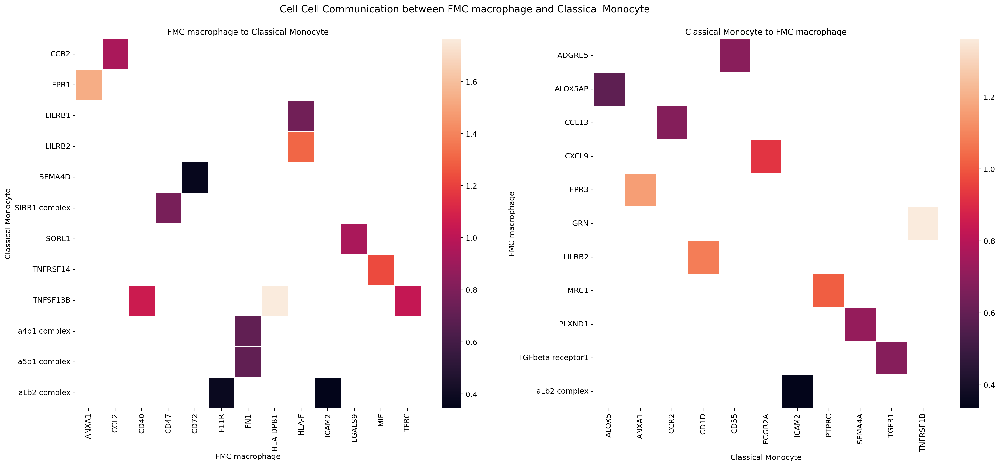

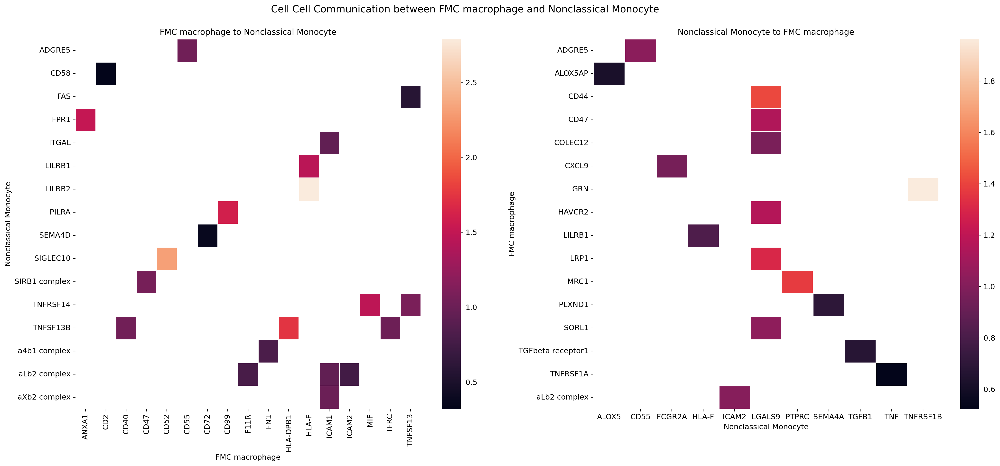

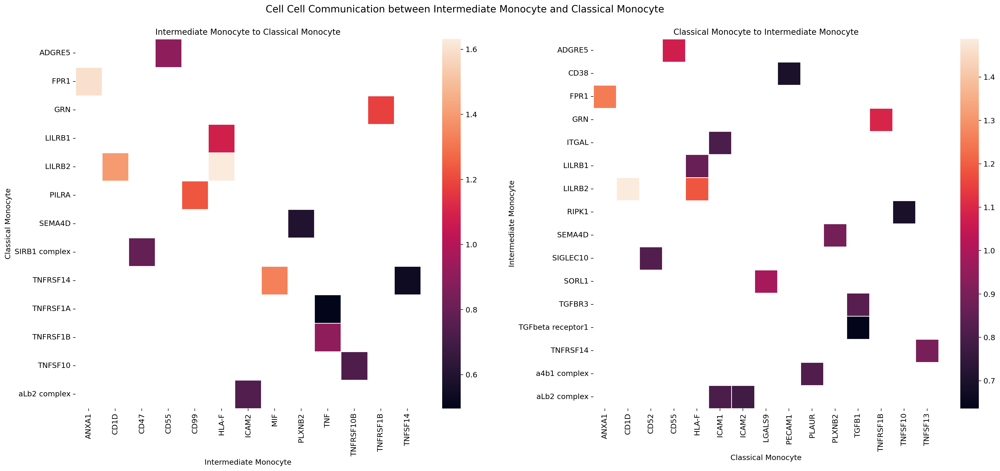

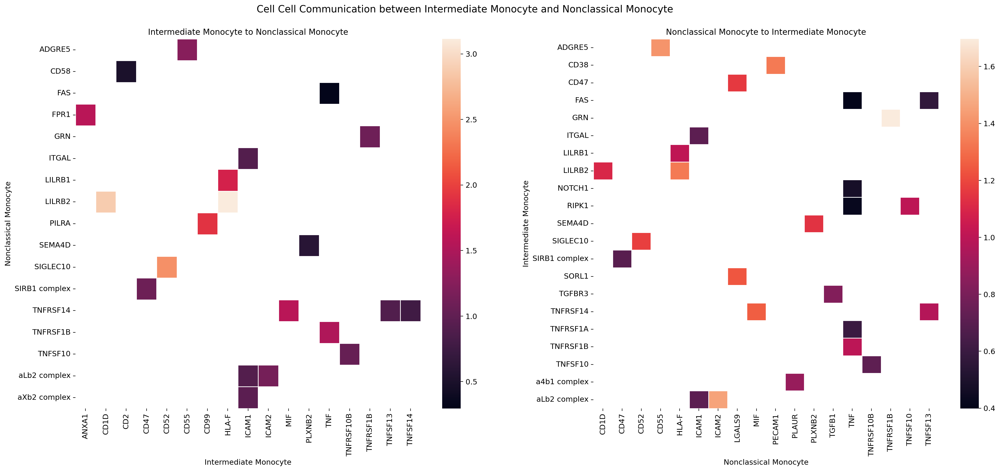

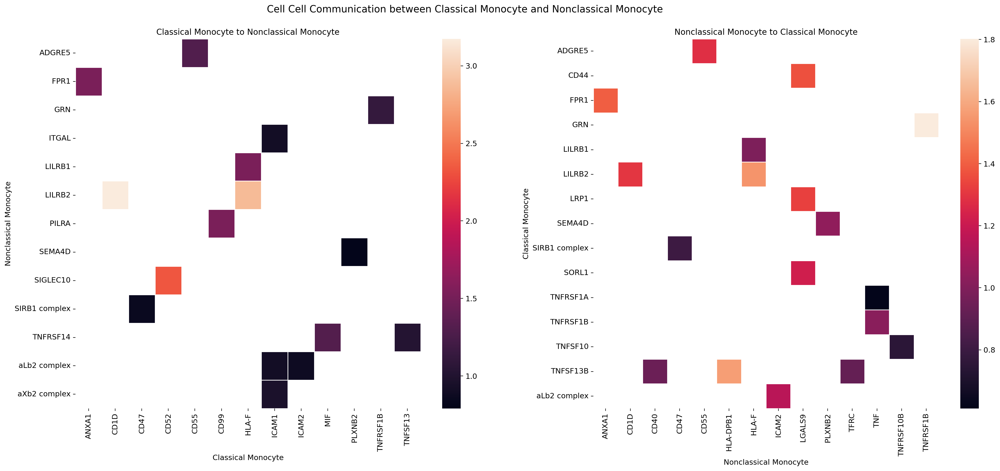

In [14]:
groups = adata.obs['Defined_type'].unique().tolist()

for combo in itertools.combinations(groups, 2):
    Plot_cluster_pair(combo,cpdb_mean)